### The purpose of this notebook to is to recreate the regress the SSH in GLORYS onto the CWI developed in Amaya et al. (2022)

In [1]:
import os, gc; from os.path import exists
os.chdir('/vortexfs1/home/anthony.meza/CTWPC/scripts')
main_dir = "/vortexfs1/home/anthony.meza/CTWPC"
plotsdir = lambda x="": main_dir + "/plots/" + x
GLORYS_dir = lambda x="": main_dir + "/GLORYS_data" + x
GLORYS_data_dir = lambda x="": main_dir + "/GLORYS_processed/" + x
ERA5_data_dir = lambda x="": main_dir + "/ERA5_data/" + x

In [2]:
# from help_funcs import * 
# from eofs.xarray import Eof
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import importlib
import xarray as xr
import seaborn as sns
import pandas as pd
import cmocean.cm as cm
import netCDF4 as nc
from pathlib import Path
import matplotlib.pyplot as plt
import gc
from multiprocessing import Pool
import os 
import multiprocessing
from os.path import exists
import dask_labextension
from pathlib import Path
import numpy as np
import dask
from multipledispatch import dispatch
from scipy import stats
import pickle
sns.set_context("talk")

In [3]:
from multipledispatch import dispatch
@dispatch(object, object)
def prepare_IVTE_and_IVTN(DJF_phases, phase):
    IVT = xr.merge([DJF_phases["IVTE"][phase].mean("time"), DJF_phases["IVTN"][phase].mean("time")]).sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80))
    IVT = IVT.isel(longitude = slice(0, None, 8), latitude =  slice(0, None, 8))
    IVT["IVT"] = np.sqrt(IVT["IVTE"]**2 + IVT["IVTN"]**2)
    IVT["IVT"].attrs["units"] = "(kg m)/s "
    # IVT["IVTE"] = IVT["IVTE"] / IVT["IVT"]
    # IVT["IVTN"] = IVT["IVTN"] / IVT["IVT"]
    return IVT 
@dispatch(object)
def prepare_IVTE_and_IVTN(DJF_phase):
    IVT = xr.merge([DJF_phase["IVTE"], DJF_phase["IVTN"]]).sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80))
    IVT = IVT.isel(longitude = slice(0, None, 8), latitude =  slice(0, None, 8))
    IVT["IVT"] = np.sqrt(IVT["IVTE"]**2 + IVT["IVTN"]**2)
    IVT["IVT"].attrs["units"] = "(kg m)/s "
    return IVT 

In [4]:
def combine_phases(var_phases, phases_dict):
    d = dict()
    d["18"] = xr.merge([var_phases["1"], var_phases["8"]]).compute()
    d["23"] = xr.merge([var_phases["2"], var_phases["3"]]).compute()
    d["45"] = xr.merge([var_phases["4"], var_phases["5"]]).compute()
    d["67"] = xr.merge([var_phases["6"], var_phases["7"]]).compute()
    
    return d
# combine_DJF_phases = dict()
# for key in DJF_phases.keys():
#     print(key)
#     combine_DJF_phases[key]= combine_phases(DJF_phases[key], phases_dict)
#     for phase, phase_indices in phases_dict.items(): 
#         DJF_phases[key][phase] = DJF_phases[key][phase].compute()

In [5]:

def xr_ttest_twoside(ds, axis = "time", conf_lev = 0.95):
    beta = 1 - 0.95
    timeax = ds.get_axis_num(axis)

    temp = stats.ttest_1samp(ds.values, popmean=0.0, axis = timeax, nan_policy = "propagate").pvalue
    temp[temp > beta] = np.nan
    temp[temp < beta] = 1.0
    new_ds = ds.isel({axis:0}).drop(axis)
    new_ds.values = temp
    return new_ds
def xr_ttest(ds, axis = "time", conf_lev = 0.95):
    beta = 1 - 0.96
    timeax = ds.get_axis_num(axis)
    crit_t = abs(stats.t.ppf(q=beta,df=len(ds[axis])))
    temp = stats.ttest_1samp(ds.values, popmean=0.0, axis = timeax, nan_policy = "propagate").statistic
    temp[np.abs(temp) < crit_t] = np.nan
    temp[np.abs(temp) > crit_t] = 1.0
    new_ds = ds.isel({axis:0}).drop(axis)
    new_ds.values = temp
    return new_ds
        

### We read in the Amaya Coastal Wave Index Amplitude $(\text{Index} =  \sqrt{\text{PC1}^2 + \text{PC2}^2)}$ and Phase $(\text{Phase} = atan( {\frac{\text{PC2}}{\text{PC1}}}))$ and recompute $\text{PC1}$ and $\text{PC2}$. We also remove the leap-year days from the GLORYS dataset.

In [16]:
INDEX_TYPE = "SM"
if INDEX_TYPE != "RMM":
    mxtmp_Idx = xr.open_dataset(GLORYS_data_dir("GLORYS_" + INDEX_TYPE + "_Index.nc")).sel(time = slice("1993", "2018"))
    mxtmp_Idx["ikw_amp"] = np.sqrt(mxtmp_Idx["PC1"]**2 + mxtmp_Idx["PC2"]**2)

# Store data (serialize)
indexdir = INDEX_TYPE + "_Phases"

with open(GLORYS_data_dir(INDEX_TYPE + "_Phases/Composites.pickle"), 'rb') as handle:
    DJF_phases = pickle.load(handle)
# # Store data (serialize)
# with open(GLORYS_data_dir(INDEX_TYPE + "_Phases/CompositesPhase4.pickle"), 'rb') as handle:
#     DJF_phase4_dict = pickle.load(handle)
# Store data (serialize)
with open(GLORYS_data_dir(INDEX_TYPE + "_Phases/IndexPhases.pickle"), 'rb') as handle:
    phases_dict = pickle.load(handle)

In [17]:
labels_dict = {"SM" : "SSH/SST CTW Index", "S" : "SSH CTW Index", "RMM" : "RMM Index"}

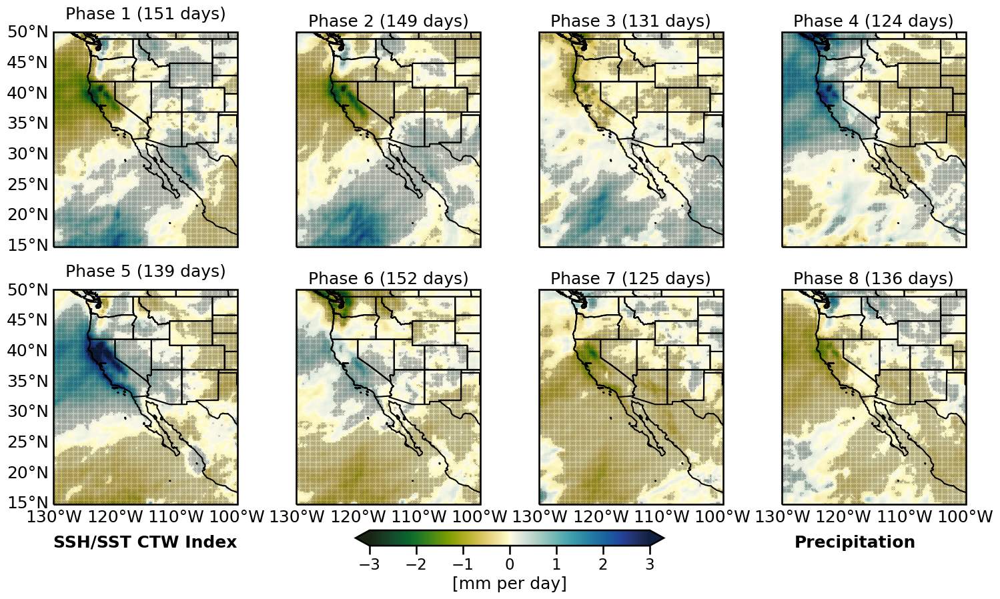

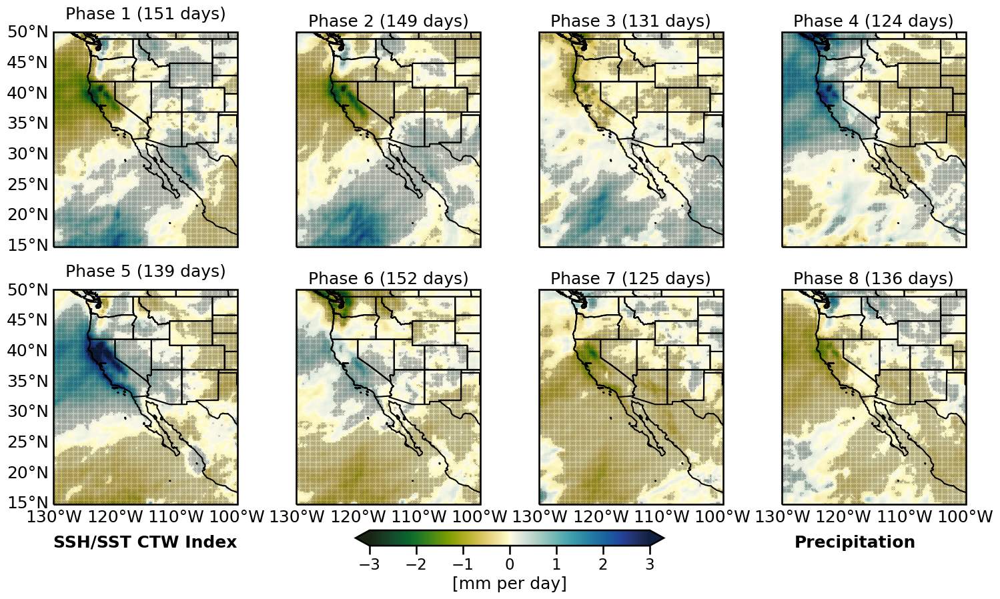

In [18]:
fig, axes = plt.subplots(ncols = 4, nrows = 2, figsize = (18, 10), subplot_kw={'projection': ccrs.PlateCarree()})
z500_levels = np.arange(-0.4, 0.41, 0.1) 
# fig.tight_layout()

for phase, phase_indices in phases_dict.items():
    phase_num = int(phase) - 1; i = phase_num
    ax = axes.flatten(order = "C")[phase_num]
    ax.add_feature(cfeature.STATES) in axes.flatten()

    if phase != "8":
        DJF_phases["Precip"][phase].mean("time").sel(latitude = slice(50,  15)).sel(longitude = slice(-130, -100)).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3, vmax = 3, add_colorbar = False)
        statistics = xr_ttest(DJF_phases["Precip"][phase]).sel(latitude = slice(50,  15)).sel(longitude = slice(-130, -100))
        LONS, LATS = np.meshgrid(statistics.longitude.values, statistics.latitude.values)
        ax.scatter((LONS * statistics.values), (LATS * statistics.values), transform = ccrs.PlateCarree(), s = 0.07, marker = "x", alpha = 0.4, c = "k")
        ax.set_title("Phase " + str(phase_num+1) + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 18)

        # ax.clabel(cs, inline=True, fontsize=10)
    else:    
        DJF_phases["Precip"][phase].mean("time").sel(latitude = slice(50,  15)).sel(longitude = slice(-130, -100)).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3, vmax = 3, add_colorbar = True,zorder=0, 
                                                                                               cbar_kwargs = {"label":"[mm per day]", "extend": "both", 
                                                                                                              "orientation":"horizontal", "ax":axes,
                                                                                                             "fraction":0.03, "pad":0.05})

        statistics = xr_ttest(DJF_phases["Precip"][phase]).sel(latitude = slice(50,  15)).sel(longitude = slice(-130, -100))
        LONS, LATS = np.meshgrid(statistics.longitude.values, statistics.latitude.values)
        ax.scatter((LONS * statistics.values), (LATS * statistics.values), transform = ccrs.PlateCarree(), s = 0.07, marker = "x", alpha = 0.4, c = "k")
        
        ax.set_title("Phase " + str(phase_num+1) + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 18)

axes[-1, -1].text(0.4, -0.2, "Precipitation", 
                  transform=axes[-1, -1].transAxes, horizontalalignment = "center", fontweight = "bold")
axes[-1, 0].text(0.5, -0.2, labels_dict[INDEX_TYPE], 
                  transform=axes[-1, 0].transAxes, horizontalalignment = "center", fontweight = "bold")
for (i, ax) in enumerate(axes[:, 0].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.bottom_labels = False
    gl.right_labels = False
    
    
for (i, ax) in enumerate(axes[1, :].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = False
[ax.coastlines() for ax in axes.flatten()];

    
fig.savefig(plotsdir("generals/" + INDEX_TYPE + "_Index_Precip_CompositesDJFM.png"), bbox_inches = "tight")
fig

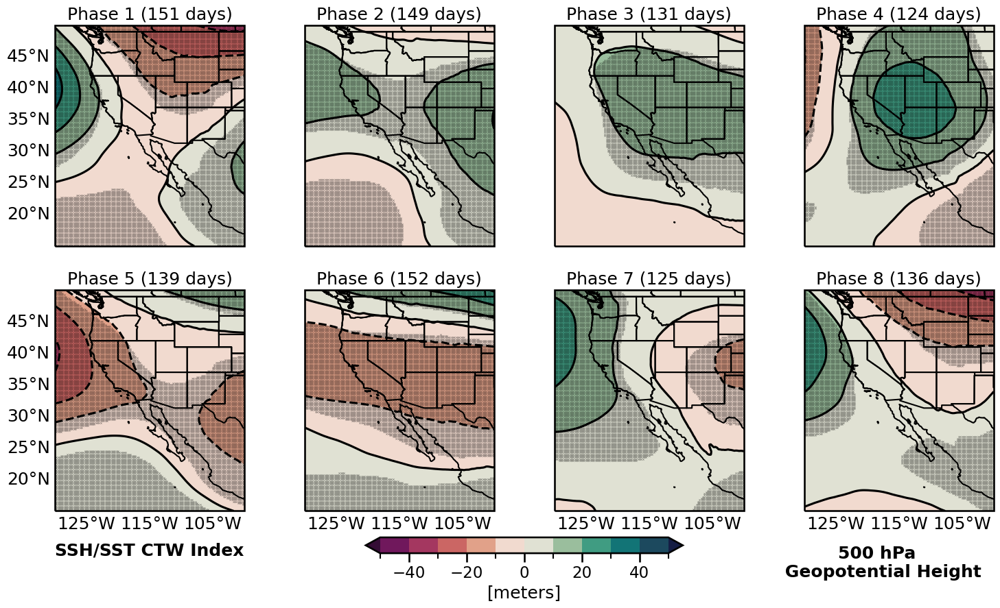

In [19]:
fig, axes = plt.subplots(ncols = 4, nrows = 2, figsize = (18, 10), subplot_kw={'projection': ccrs.PlateCarree()})
z500_levels = np.arange(-50, 51, 10) 
# fig.tight_layout()

for phase, phase_indices in phases_dict.items():
    phase_num = int(phase) - 1; i = phase_num
    ax = axes.flatten(order = "C")[phase_num]
    ax.add_feature(cfeature.STATES) in axes.flatten()

    if phase != "8":
        DJF_phases["z500"][phase].mean("time").sel(latitude = slice(50,  15)).sel(longitude = slice(-130, -100)).plot.contourf(ax = ax, cmap = cm.curl_r,levels = z500_levels, 
                                                                                                                               transform = ccrs.PlateCarree(),
                                                                                              vmin = -50, vmax =50, add_colorbar = False, extend = "both")
        CS = DJF_phases["z500"][phase].mean("time").sel(latitude = slice(50,  15)).sel(longitude = slice(-130, -100)).plot.contour(ax = ax, colors = "black", levels = z500_levels,
                                                                                                               transform = ccrs.PlateCarree())

        # ax.clabel(CS, CS.levels, inline=True, fontsize=10)
        statistics = xr_ttest(DJF_phases["z500"][phase]).sel(latitude = slice(50,  15)).sel(longitude = slice(-130, -100))
        LONS, LATS = np.meshgrid(statistics.longitude.values, statistics.latitude.values)
        ax.scatter((LONS * statistics.values), (LATS * statistics.values), transform = ccrs.PlateCarree(), s = 0.07, marker = "x", alpha = 0.5, c = "k", zorder = 10)
        ax.set_title("Phase " + str(phase_num+1) + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 18)

        # ax.clabel(cs, inline=True, fontsize=10)
    else:    
        DJF_phases["z500"][phase].mean("time").sel(latitude = slice(50,  15)).sel(longitude = slice(-130, -100)).plot.contourf(ax = ax, cmap = cm.curl_r,levels = z500_levels,transform = ccrs.PlateCarree(),
                                                                                              vmin = -50, vmax = 50, add_colorbar = True,zorder=0, extend = "both",
                                                                                               cbar_kwargs = {"label":"[meters]", "extend": "both", 
                                                                                                              "orientation":"horizontal", "ax":axes,
                                                                                                             "fraction":0.03, "pad":0.05})
        CS = DJF_phases["z500"][phase].mean("time").sel(latitude = slice(50,  15)).sel(longitude = slice(-130, -100)).plot.contour(ax = ax, colors = "black", levels = z500_levels,
                                                                                                               transform = ccrs.PlateCarree())
        statistics = xr_ttest(DJF_phases["z500"][phase]).sel(latitude = slice(50,  15)).sel(longitude = slice(-130, -100))
        LONS, LATS = np.meshgrid(statistics.longitude.values, statistics.latitude.values)
        ax.scatter((LONS * statistics.values), (LATS * statistics.values), transform = ccrs.PlateCarree(), s = 0.07, marker = "x", alpha = 0.5, c = "k", zorder = 10)
        
        ax.set_title("Phase " + str(phase_num+1) + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 18)

for (i, ax) in enumerate(axes[:, 0].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.bottom_labels = False
    gl.right_labels = False
    
    
for (i, ax) in enumerate(axes[1, :].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = False
[ax.coastlines() for ax in axes.flatten()];

axes[-1, -1].text(0.4, -0.3, "500 hPa \n Geopotential Height", 
                  transform=axes[-1, -1].transAxes, horizontalalignment = "center", fontweight = "bold")
axes[-1, 0].text(0.5, -0.2, labels_dict[INDEX_TYPE], 
                  transform=axes[-1, 0].transAxes, horizontalalignment = "center", fontweight = "bold")

fig.savefig(plotsdir("generals/" + INDEX_TYPE + "_Index_z500_CompositesDJFM.png"), bbox_inches = "tight")

phase
phase
phase
phase
phase
phase
phase
phase


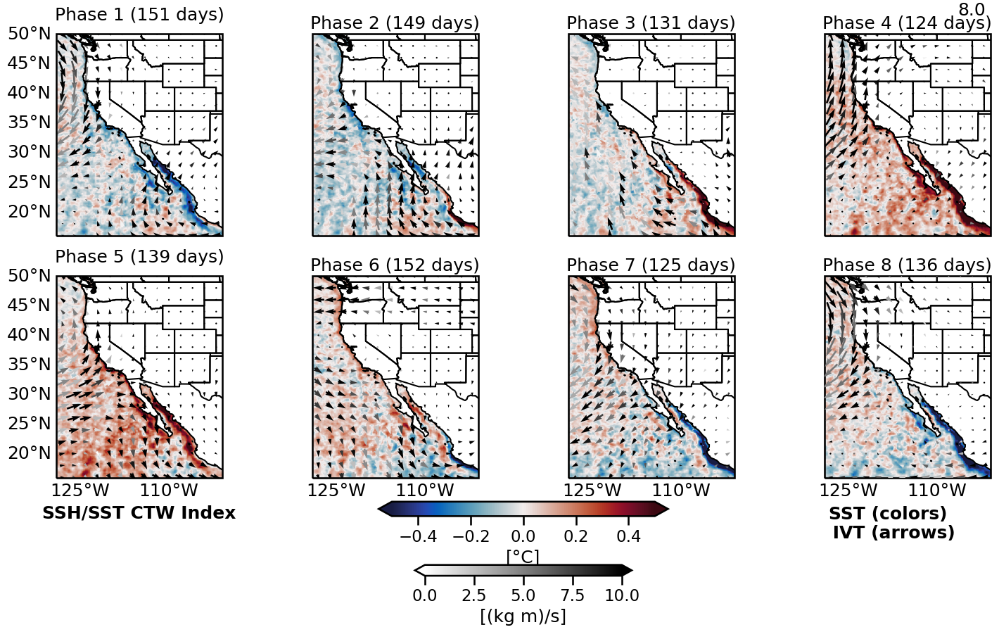

In [20]:
fig, axes = plt.subplots(ncols = 4, nrows = 2, figsize = (18, 10), subplot_kw={'projection': ccrs.PlateCarree()})
z500_levels = np.arange(-0.4, 0.41, 0.1) 
# fig.tight_layout()
[ax.coastlines() for ax in axes.flatten()];

# fig.suptitle("Composites using SSH Coastal Wave Index (DJFM only) \n SST anomaly (colored); Integrated Vapour Flux (arrows)", fontsize = 17)

for phase, phase_indices in phases_dict.items():
    phase_num = int(phase) - 1; i = phase_num
    # i = (phase_num + 6) % 8
    ax = axes.flatten(order = "C")[i]
    IVT = prepare_IVTE_and_IVTN(DJF_phases, phase).sel(latitude = slice(50,  16)).sel(longitude = slice(-129, -101))
    var = DJF_phases["SST"][phase].sel(latitude = slice(16, 50), longitude = slice(-129, -101))
    ax.add_feature(cfeature.STATES) in axes.flatten()
    print("phase")
    if i < 10:
        if phase != "8":
            var.mean("time").plot(ax = ax, cmap = cm.balance,transform = ccrs.PlateCarree(), vmin = -0.5, vmax = 0.5, shading = "nearest", add_colorbar = False)
            IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
                        add_guide = False, cmap = "gist_yarg", width = 0.011, vmin = 0, vmax = 10)

            ax.set_title("Phase " + str(phase_num+1) + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 18)

            # ax.clabel(cs, inline=True, fontsize=10)
        else:
            IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
                        add_guide = True, cmap = "gist_yarg", width = 0.011, vmin = 0, vmax = 10, zorder=10, 
                        cbar_kwargs = {"label":"[(kg m)/s]", "extend": "both",  "orientation":"horizontal", "ax":axes, "fraction":0.02, "pad":0.09})
            var.mean("time").plot.pcolormesh(ax = ax, cmap = cm.balance,transform = ccrs.PlateCarree(),
                                                                                                  vmin = -0.5, vmax = 0.5, add_colorbar = True,zorder=0,
                                                                                                   cbar_kwargs = {"label":"[°C]", "extend": "both", 
                                                                                                                  "orientation":"horizontal", "ax":axes,
                                                                                                                 "fraction":0.03, "pad":0.05})
        
        ax.set_title("Phase " + str(phase_num+1) + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 18)
        # ax.clabel(cs, inline=True, fontsize=10)

for (i, ax) in enumerate(axes[:, 0].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.bottom_labels = False
    gl.right_labels = False
    
    
for (i, ax) in enumerate(axes[1, :].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = False
axes[-1, -1].text(0.4, -0.3, "SST (colors) \n IVT (arrows)", 
                  transform=axes[-1, -1].transAxes, horizontalalignment = "center", fontweight = "bold")
axes[-1, 0].text(0.5, -0.2, labels_dict[INDEX_TYPE], 
                  transform=axes[-1, 0].transAxes, horizontalalignment = "center", fontweight = "bold")

fig.savefig(plotsdir("generals/" + INDEX_TYPE + "_Index_SST_IVT_CompositesDJF.png"), bbox_inches = "tight")

phase
phase
phase
phase
phase
phase
phase
phase


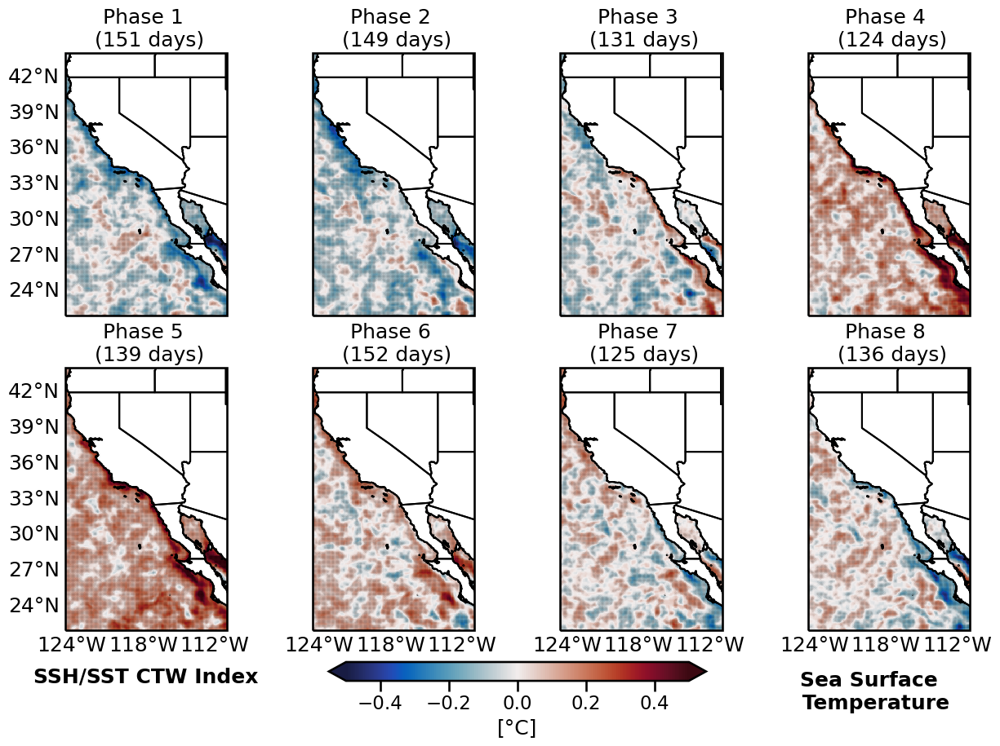

In [21]:
fig, axes = plt.subplots(ncols = 4, nrows = 2, figsize = (15, 10), subplot_kw={'projection': ccrs.PlateCarree()})
z500_levels = np.arange(-0.4, 0.41, 0.1) 
# fig.tight_layout()
[ax.coastlines() for ax in axes.flatten()];

# fig.suptitle("Composites using SSH Coastal Wave Index (DJFM only) \n SST anomaly (colored); Integrated Vapour Flux (arrows)", fontsize = 17)

for phase, phase_indices in phases_dict.items():
    phase_num = int(phase) - 1; i = phase_num
    # i = (phase_num + 6) % 8
    ax = axes.flatten(order = "C")[i]
    IVT = prepare_IVTE_and_IVTN(DJF_phases, phase).sel(latitude = slice(49,  16)).sel(longitude = slice(-129, -101))
    var = DJF_phases["SST"][phase].sel(latitude = slice(22, 44), longitude = slice(-124.5, -111))
    ax.add_feature(cfeature.STATES) in axes.flatten()
    print("phase")
    if i < 10:
        if phase != "8":
            var.mean("time").plot(ax = ax, cmap = cm.balance,transform = ccrs.PlateCarree(), vmin = -0.5, vmax = 0.5, shading = "nearest", add_colorbar = False)
            # IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
            #             add_guide = False, cmap = "gist_yarg", width = 0.012, vmin = 0, vmax = 10)

            ax.set_title("Phase " + str(phase_num+1) + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 18)

            # ax.clabel(cs, inline=True, fontsize=10)
        else:
            # IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
            #             add_guide = True, cmap = "gist_yarg", width = 0.012, vmin = 0, vmax = 10, zorder=10, 
            #             cbar_kwargs = {"label":"[(kg m)/s]", "extend": "both",  "orientation":"horizontal", "ax":axes, "fraction":0.02, "pad":0.09})
            var.mean("time").plot.pcolormesh(ax = ax, cmap = cm.balance,transform = ccrs.PlateCarree(),
                                                                                                  vmin = -0.5, vmax = 0.5, add_colorbar = True,zorder=0,
                                                                                                   cbar_kwargs = {"label":"[°C]", "extend": "both", 
                                                                                                                  "orientation":"horizontal", "ax":axes,
                                                                                                                 "fraction":0.03, "pad":0.05})
        statistics = xr_ttest(var)
        LONS, LATS = np.meshgrid(statistics.longitude.values, statistics.latitude.values)
        ax.scatter((LONS * statistics.values), (LATS * statistics.values), transform = ccrs.PlateCarree(), s = 0.07, marker = "x", alpha = 0.07, c = "k", zorder = 10)        
        ax.set_title("Phase " + str(phase_num+1) + " \n (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 18)
        # ax.clabel(cs, inline=True, fontsize=10)

for (i, ax) in enumerate(axes[:, 0].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.bottom_labels = False
    gl.right_labels = False
    
    
for (i, ax) in enumerate(axes[1, :].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = False

axes[-1, -1].text(0.4, -0.3, "Sea Surface \n Temperature", 
                  transform=axes[-1, -1].transAxes, horizontalalignment = "center", fontweight = "bold")
axes[-1, 0].text(0.5, -0.2, labels_dict[INDEX_TYPE], 
                  transform=axes[-1, 0].transAxes, horizontalalignment = "center", fontweight = "bold")

fig.savefig(plotsdir("generals/" + INDEX_TYPE + "_Index_SST_California_CompositesDJF.png"), bbox_inches = "tight")

phase
phase
phase
phase
phase
phase
phase
phase


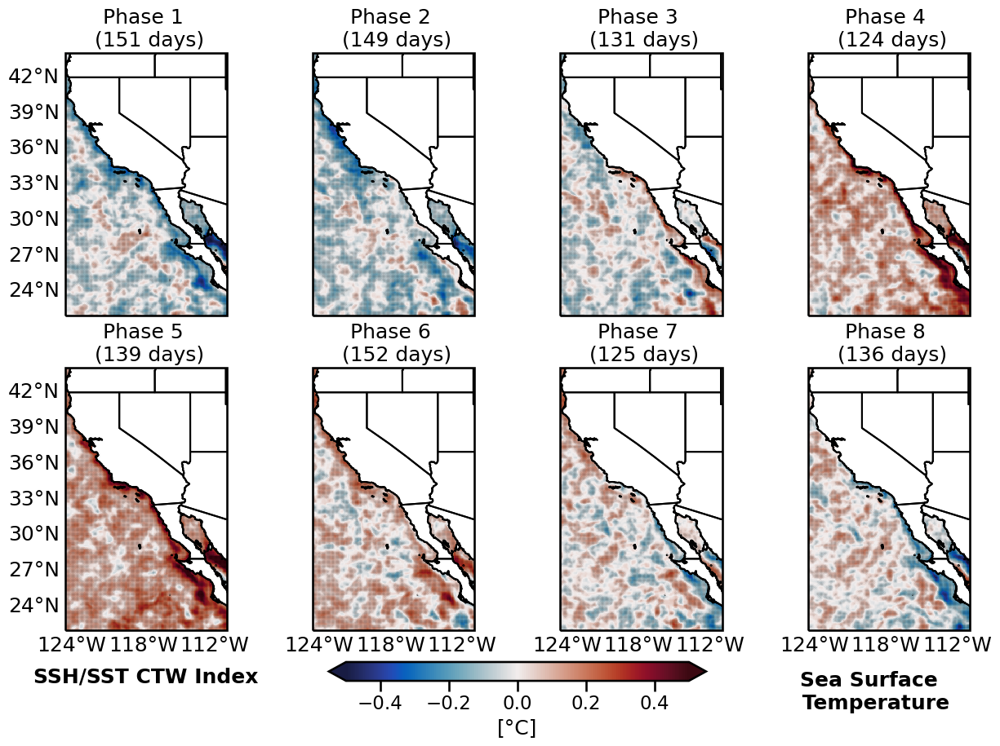

In [22]:
fig, axes = plt.subplots(ncols = 4, nrows = 2, figsize = (15, 10), subplot_kw={'projection': ccrs.PlateCarree()})
z500_levels = np.arange(-0.4, 0.41, 0.1) 
# fig.tight_layout()
[ax.coastlines() for ax in axes.flatten()];

# fig.suptitle("Composites using SSH Coastal Wave Index (DJFM only) \n SST anomaly (colored); Integrated Vapour Flux (arrows)", fontsize = 17)

for phase, phase_indices in phases_dict.items():
    phase_num = int(phase) - 1; i = phase_num
    # i = (phase_num + 6) % 8
    ax = axes.flatten(order = "C")[i]
    IVT = prepare_IVTE_and_IVTN(DJF_phases, phase).sel(latitude = slice(49,  16)).sel(longitude = slice(-129, -101))
    var = DJF_phases["SST"][phase].sel(latitude = slice(22, 44), longitude = slice(-124.5, -111))
    ax.add_feature(cfeature.STATES) in axes.flatten()
    print("phase")
    if i < 10:
        if phase != "8":
            var.mean("time").plot(ax = ax, cmap = cm.balance,transform = ccrs.PlateCarree(), vmin = -0.5, vmax = 0.5, shading = "nearest", add_colorbar = False)
            # IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
            #             add_guide = False, cmap = "gist_yarg", width = 0.012, vmin = 0, vmax = 10)

            ax.set_title("Phase " + str(phase_num+1) + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 18)

            # ax.clabel(cs, inline=True, fontsize=10)
        else:
            # IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
            #             add_guide = True, cmap = "gist_yarg", width = 0.012, vmin = 0, vmax = 10, zorder=10, 
            #             cbar_kwargs = {"label":"[(kg m)/s]", "extend": "both",  "orientation":"horizontal", "ax":axes, "fraction":0.02, "pad":0.09})
            var.mean("time").plot.pcolormesh(ax = ax, cmap = cm.balance,transform = ccrs.PlateCarree(),
                                                                                                  vmin = -0.5, vmax = 0.5, add_colorbar = True,zorder=0,
                                                                                                   cbar_kwargs = {"label":"[°C]", "extend": "both", 
                                                                                                                  "orientation":"horizontal", "ax":axes,
                                                                                                                 "fraction":0.03, "pad":0.05})
        statistics = xr_ttest(var)
        LONS, LATS = np.meshgrid(statistics.longitude.values, statistics.latitude.values)
        ax.scatter((LONS * statistics.values), (LATS * statistics.values), transform = ccrs.PlateCarree(), s = 0.07, marker = "x", alpha = 0.07, c = "k", zorder = 10)        
        ax.set_title("Phase " + str(phase_num+1) + " \n (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 18)
        # ax.clabel(cs, inline=True, fontsize=10)

for (i, ax) in enumerate(axes[:, 0].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.bottom_labels = False
    gl.right_labels = False
    
    
for (i, ax) in enumerate(axes[1, :].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = False

axes[-1, -1].text(0.4, -0.3, "Sea Surface \n Temperature", 
                  transform=axes[-1, -1].transAxes, horizontalalignment = "center", fontweight = "bold")
axes[-1, 0].text(0.5, -0.2, labels_dict[INDEX_TYPE], 
                  transform=axes[-1, 0].transAxes, horizontalalignment = "center", fontweight = "bold")

fig.savefig(plotsdir("generals/" + INDEX_TYPE + "_Index_SST_California_CompositesDJF.png"), bbox_inches = "tight")

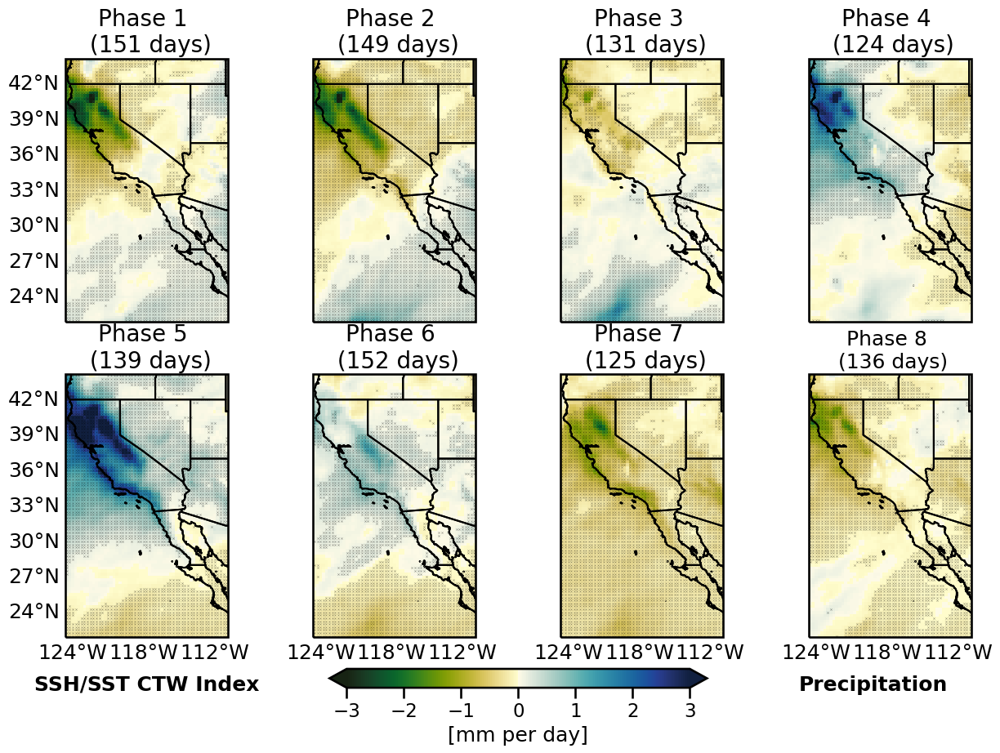

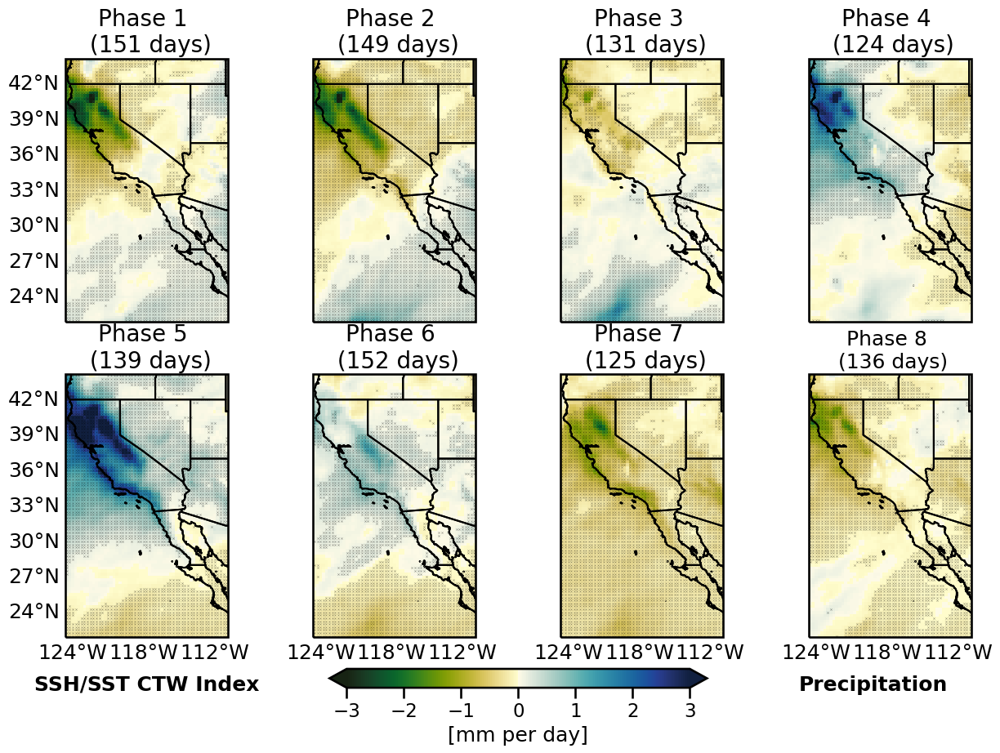

In [23]:
fig, axes = plt.subplots(ncols = 4, nrows = 2, figsize = (15, 10), subplot_kw={'projection': ccrs.PlateCarree()})
z500_levels = np.arange(-0.4, 0.41, 0.1) 
# fig.tight_layout()

for phase, phase_indices in phases_dict.items():
    phase_num = int(phase) - 1; i = phase_num
    ax = axes.flatten(order = "C")[phase_num]
    ax.add_feature(cfeature.STATES) in axes.flatten()

    if phase != "8":
        DJF_phases["Precip"][phase].mean("time").sel(latitude = slice(44,  22)).sel(longitude = slice(-124.5, -111)).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3, vmax = 3, add_colorbar = False)
        statistics = xr_ttest(DJF_phases["Precip"][phase]).sel(latitude = slice(44,  22)).sel(longitude = slice(-124.5, -111))
        LONS, LATS = np.meshgrid(statistics.longitude.values, statistics.latitude.values)
        ax.scatter((LONS * statistics.values), (LATS * statistics.values), transform = ccrs.PlateCarree(), s = 0.07, marker = "x", alpha = 0.4, c = "k")
        ax.set_title("Phase " + str(phase_num+1) + " \n (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 20)

        # ax.clabel(cs, inline=True, fontsize=10)
    else:    
        DJF_phases["Precip"][phase].mean("time").sel(latitude = slice(44,  22)).sel(longitude = slice(-124.5, -111)).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3, vmax = 3, add_colorbar = True,zorder=0, 
                                                                                               cbar_kwargs = {"label":"[mm per day]", "extend": "both", 
                                                                                                              "orientation":"horizontal", "ax":axes,
                                                                                                             "fraction":0.03, "pad":0.05})

        statistics = xr_ttest(DJF_phases["Precip"][phase]).sel(latitude = slice(44,  22)).sel(longitude = slice(-124.5, -111))
        LONS, LATS = np.meshgrid(statistics.longitude.values, statistics.latitude.values)
        ax.scatter((LONS * statistics.values), (LATS * statistics.values), transform = ccrs.PlateCarree(), s = 0.07, marker = "x", alpha = 0.4, c = "k")
        
        ax.set_title("Phase " + str(phase_num+1) + " \n (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 18)

axes[-1, -1].text(0.4, -0.2, "Precipitation", 
                  transform=axes[-1, -1].transAxes, horizontalalignment = "center", fontweight = "bold")
axes[-1, 0].text(0.5, -0.2, labels_dict[INDEX_TYPE], 
                  transform=axes[-1, 0].transAxes, horizontalalignment = "center", fontweight = "bold")
for (i, ax) in enumerate(axes[:, 0].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.bottom_labels = False
    gl.right_labels = False
    
    
for (i, ax) in enumerate(axes[1, :].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = False
[ax.coastlines() for ax in axes.flatten()];

    
fig.savefig(plotsdir("generals/" + INDEX_TYPE + "_Index_Precip_California_CompositesDJFM.png"), bbox_inches = "tight")
fig

In [24]:
bins = np.array([13.72497368, 15.4819994 , 17.23902512, 18.99605179, 20.75307846,
       22.51010323, 24.2671299 , 26.02415657, 27.78118134, 29.53820801,
       31.29523468, 33.05226135, 34.80928421, 36.56631088, 38.32333755,
       40.08036423, 41.8373909 , 43.59441757, 45.35144043, 47.1084671 ,
       48.86549377])
bins = bins - 2
colors = dict()
colors["RMM"] = sns.color_palette()[2]
colors["SM"] = sns.color_palette()[3]
colors["S"] = sns.color_palette()[0]

1.15
139
0.93
136


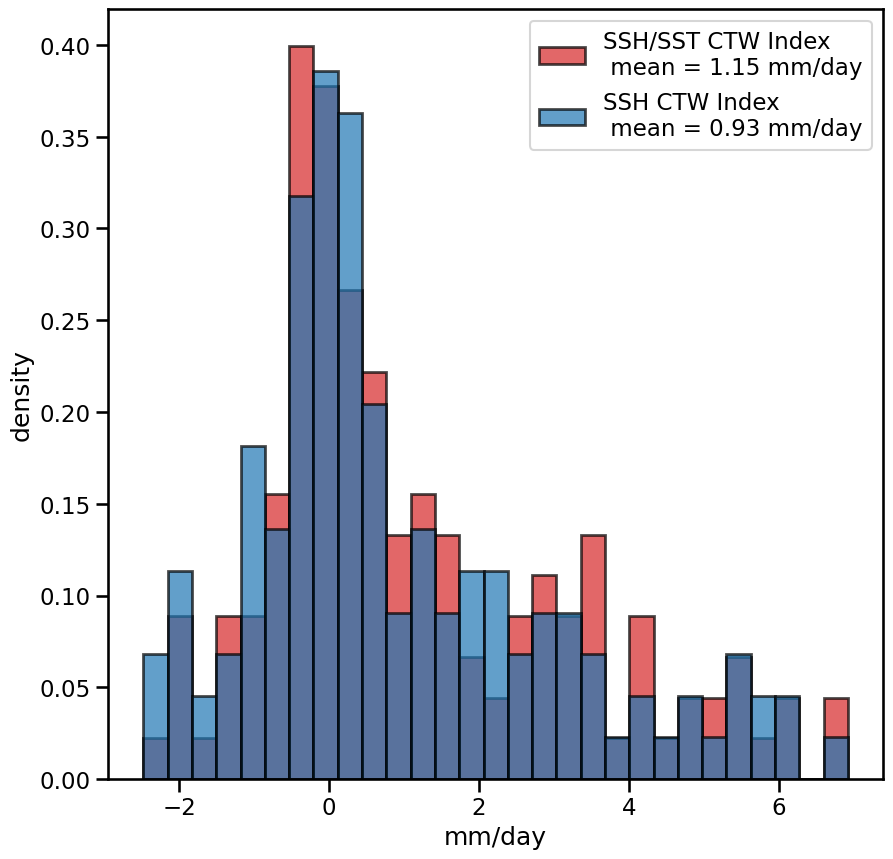

In [25]:
z500_levels = np.arange(-0.4, 0.41, 0.1) 
# fig.tight_layout()
data = []

fig, axes = plt.subplots(figsize = (10, 10))
dists = dict()
for INDEX_TYPE in ["SM", "S"]:
    with open(GLORYS_data_dir(INDEX_TYPE + "_Phases/Composites.pickle"), 'rb') as handle:
        DJF_phases = pickle.load(handle)
    var = DJF_phases["Precip"]["5"].sel(latitude = slice(42,  32)).sel(longitude = slice(-124.5, -114)).mean(["latitude", "longitude"])
    vals = var.values.flatten()
    dists[INDEX_TYPE] = vals

bins = np.linspace(min(dists["SM"].min(),dists["S"].min()), max(dists["SM"].max(), dists["S"].max()), 30)
dists = dict()
for INDEX_TYPE in ["SM", "S"]:
    with open(GLORYS_data_dir(INDEX_TYPE + "_Phases/Composites.pickle"), 'rb') as handle:
        DJF_phases = pickle.load(handle)
    var = DJF_phases["Precip"]["5"].sel(latitude = slice(42,  32)).sel(longitude = slice(-124.5, -114)).mean(["latitude", "longitude"])
    vals = var.values.flatten()
    nine = np.percentile(vals, 50.0)
    pmean = np.round(np.mean(vals), 2)
    print(pmean)
    print(len(vals))
    dists[INDEX_TYPE] = vals

    axes.hist(vals, label = labels_dict[INDEX_TYPE] + "\n mean = " + str(pmean) + " mm/day", stacked = True, 
              linewidth = 2, histtype='bar', ec='black', bins = bins, alpha = 0.7, color= colors[INDEX_TYPE], density = True)
    
axes.legend()
axes.set_ylabel("density")
axes.set_xlabel("mm/day")
fig.savefig(plotsdir("generals/Index_Precip_California_AveragePrecip.png"), bbox_inches = "tight")


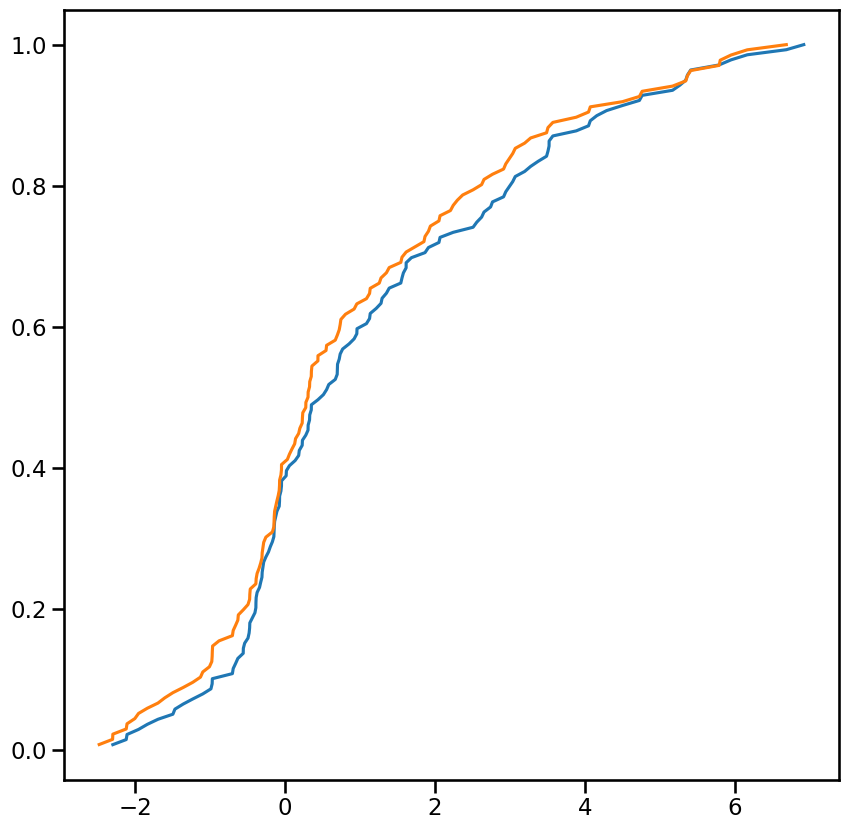

In [26]:
import numpy as np
import matplotlib.pyplot as plt

def plot_empirical_cdf(data, ax):
    # Sort the data in ascending order
    sorted_data = np.sort(data)

    # Calculate the cumulative probabilities
    n = len(sorted_data)
    y_values = np.arange(1, n + 1) / n

    # Plot the empirical CDF
    ax.plot(sorted_data, y_values)
    # plt.xlabel('Data Points')
    # plt.ylabel('Cumulative Probability')
    # plt.title('Empirical Cumulative Distribution Function')

# Example usage
data = [1, 2, 3, 4, 5, 5, 6, 7, 8, 8, 8, 9, 10]
fig, axes = plt.subplots(figsize = (10, 10))

plot_empirical_cdf(dists["SM"], axes)
plot_empirical_cdf(dists["S"], axes)

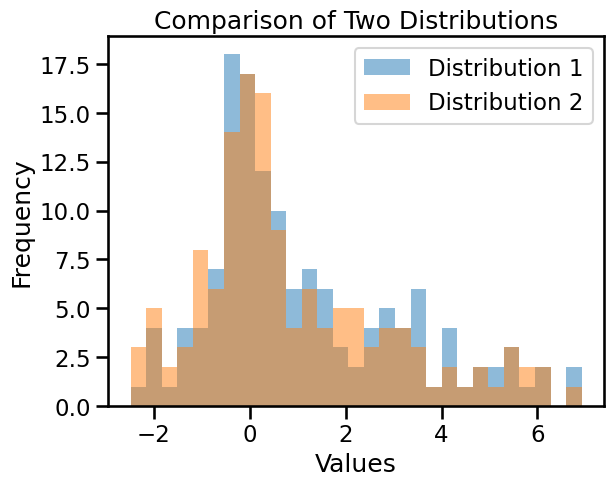

Kolmogorov-Smirnov statistic: 0.06273804485823106
P-value: 0.925111582618038


In [27]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ks_2samp

# Perform Kolmogorov-Smirnov test
statistic, p_value = stats.ks_2samp(dists["SM"], dists["S"])

# Plot histograms
plt.hist(dists["SM"], bins=bins, alpha=0.5, label='Distribution 1')
plt.hist(dists["S"], bins=bins, alpha=0.5, label='Distribution 2')
plt.legend(loc='upper right')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Comparison of Two Distributions')
plt.show()

# Print the results of the test
print(f"Kolmogorov-Smirnov statistic: {statistic}")
print(f"P-value: {p_value}")

In [28]:
12.44 - 11.52

0.9199999999999999

12.44
11.52
12.44
12253
11.52
11989


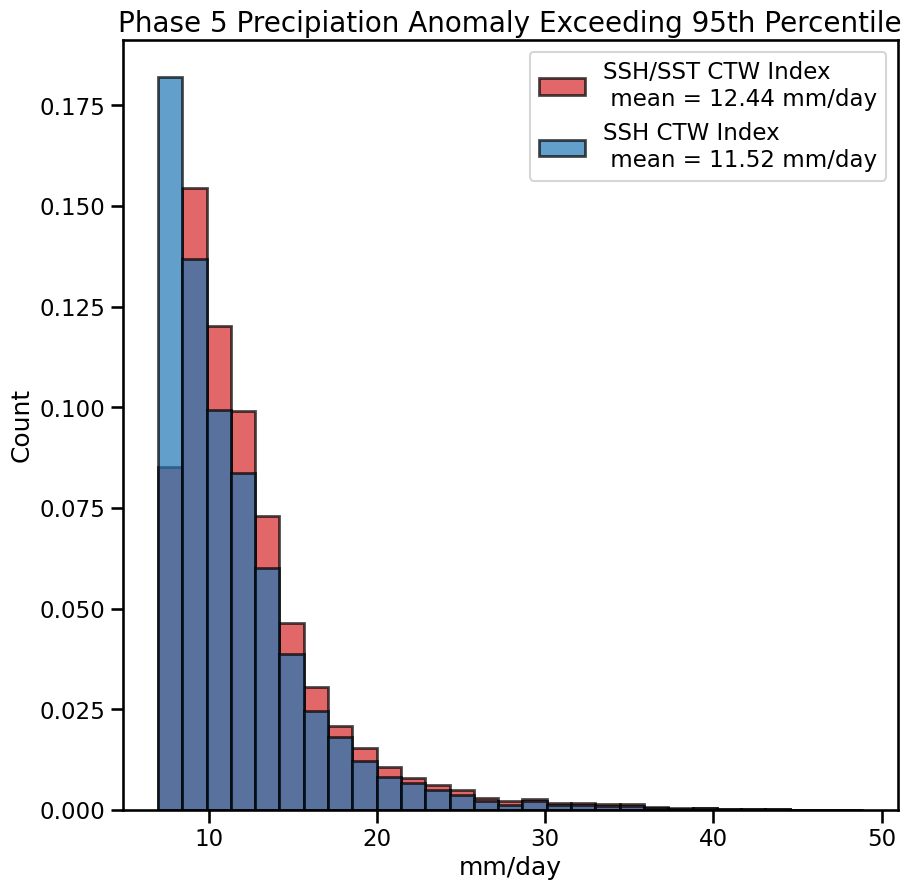

In [31]:
z500_levels = np.arange(-0.4, 0.41, 0.1) 
# fig.tight_layout()
data = []

fig, axes = plt.subplots(figsize = (10, 10))
dists = dict()
for INDEX_TYPE in ["SM", "S"]:
    with open(GLORYS_data_dir(INDEX_TYPE + "_Phases/Composites.pickle"), 'rb') as handle:
        DJF_phases = pickle.load(handle)
    var = DJF_phases["Precip"]["5"].sel(latitude = slice(42,  32)).sel(longitude = slice(-124.5, -114))
    vals = var.values.flatten()
    nine = np.percentile(vals, 95)
    pmean = np.round(np.mean(vals[vals > nine]), 2)
    print(pmean)
    dists[INDEX_TYPE] = vals[vals > nine].flatten()

bins = np.linspace(min(dists["SM"].min(),dists["S"].min()), max(dists["SM"].max(), dists["S"].max()), 30)
dists = dict()

for INDEX_TYPE in ["SM", "S"]:
    with open(GLORYS_data_dir(INDEX_TYPE + "_Phases/Composites.pickle"), 'rb') as handle:
        DJF_phases = pickle.load(handle)
    var = DJF_phases["Precip"]["5"].sel(latitude = slice(42,  32)).sel(longitude = slice(-124.5, -114))
    vals = var.values.flatten()
    nine = np.percentile(vals, 95)
    pmean = np.round(np.mean(vals[vals > nine]), 2)
    print(pmean)
    dists[INDEX_TYPE] = vals[vals > nine]
    print(len(dists[INDEX_TYPE]))

    axes.hist(vals[vals > nine], label = labels_dict[INDEX_TYPE] + "\n mean = " + str(pmean) + " mm/day", bins = bins, stacked = True, 
              linewidth = 2, histtype='bar', ec='black', color= colors[INDEX_TYPE], alpha = 0.7, density = True)
axes.set_ylabel("Count")
axes.set_xlabel("mm/day")    
axes.legend()
axes.set_title("Phase 5 Precipiation Anomaly Exceeding 95th Percentile", fontsize = 20)
fig.savefig(plotsdir("generals/Index_Precip_California_TotPrecip95.png"), bbox_inches = "tight")


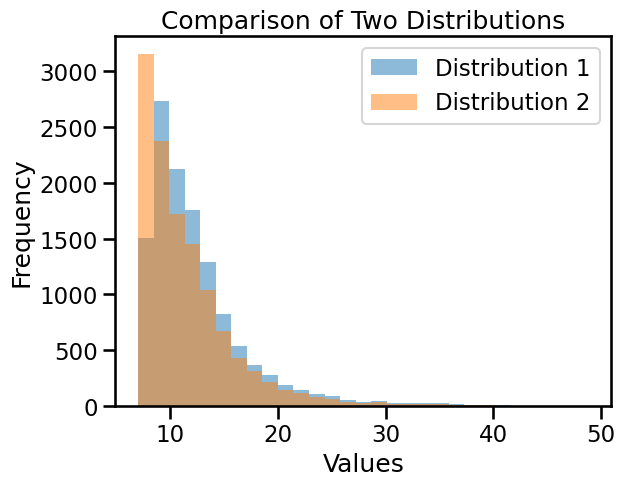

Kolmogorov-Smirnov statistic: 0.1501987284421204
P-value: 8.183475078557853e-120


In [30]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ks_2samp

# Perform Kolmogorov-Smirnov test
statistic, p_value = stats.ks_2samp(dists["SM"], dists["S"])

# Plot histograms
plt.hist(dists["SM"], bins=bins, alpha=0.5, label='Distribution 1')
plt.hist(dists["S"], bins=bins, alpha=0.5, label='Distribution 2')
plt.legend(loc='upper right')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Comparison of Two Distributions')
plt.show()

# Print the results of the test
print(f"Kolmogorov-Smirnov statistic: {statistic}")
print(f"P-value: {p_value}")

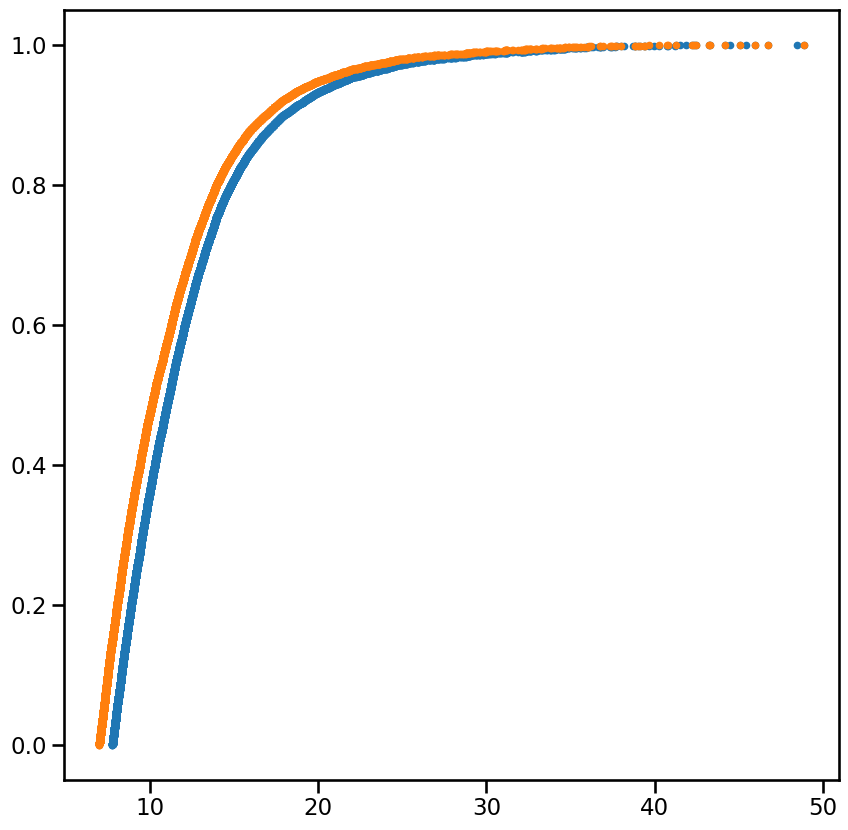

In [115]:
import numpy as np
import matplotlib.pyplot as plt

def plot_empirical_cdf(data, ax):
    # Sort the data in ascending order
    sorted_data = np.sort(data)

    # Calculate the cumulative probabilities
    n = len(sorted_data)
    y_values = np.arange(1, n + 1) / n

    # Plot the empirical CDF
    ax.plot(sorted_data, y_values, marker='.', linestyle='none')
    # plt.xlabel('Data Points')
    # plt.ylabel('Cumulative Probability')
    # plt.title('Empirical Cumulative Distribution Function')

# Example usage
data = [1, 2, 3, 4, 5, 5, 6, 7, 8, 8, 8, 9, 10]
fig, axes = plt.subplots(figsize = (10, 10))

plot_empirical_cdf(dists["SM"], axes)
plot_empirical_cdf(dists["S"], axes)

-0.08458256721496582
-0.07723112404346466
-0.3913992643356323


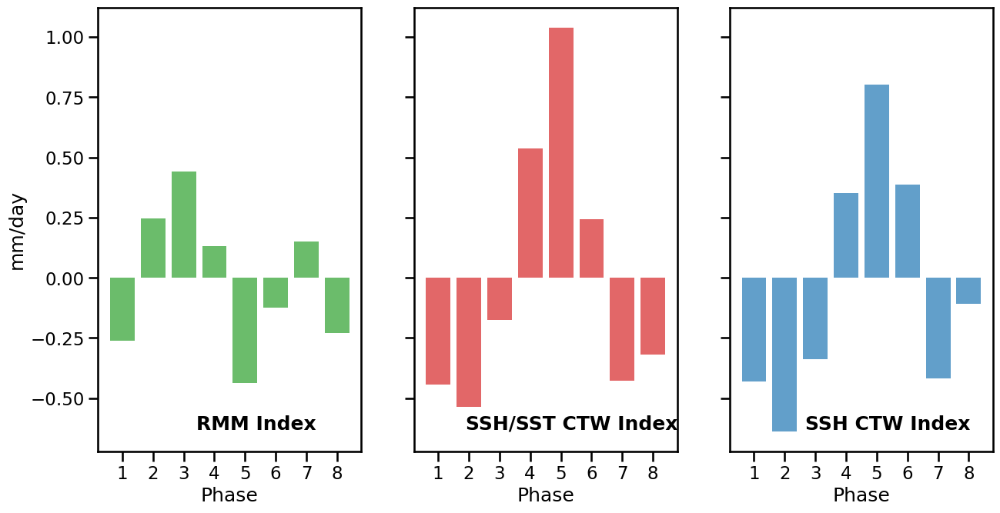

In [20]:
fig, axes = plt.subplots(1, 3, figsize = (15, 7.5), sharey = True)
    
    
for (i, INDEX_TYPE) in enumerate(["RMM", "SM", "S"]):
    with open(GLORYS_data_dir(INDEX_TYPE + "_Phases/IndexPhases.pickle"), 'rb') as handle:
        phases_dict = pickle.load(handle)
    with open(GLORYS_data_dir(INDEX_TYPE + "_Phases/Composites.pickle"), 'rb') as handle:
        DJF_phases = pickle.load(handle)
    mean_precip = dict()
    for phase, phase_indices in phases_dict.items():
        var = DJF_phases["Precip"][phase].sel(latitude = slice(44,  32)).sel(longitude = slice(-124.5, -114)).mean().values.flatten()[0]
        mean_precip[phase] = var
    names = list(mean_precip.keys())
    values = list(mean_precip.values())
    print(sum(values))
    axes[i].bar(range(len(values)), values, tick_label=names, color=colors[INDEX_TYPE], alpha=0.7)    
    axes[i].text(0.6, 0.05, labels_dict[INDEX_TYPE],
                  transform=axes[i].transAxes, horizontalalignment = "center", fontweight = "bold")
axes[0].set_ylabel("mm/day")
[a.set_xlabel("Phase") for a in axes]
fig.savefig(plotsdir("generals/Avg_PrecipAllPhases.png"), bbox_inches = "tight")


In [398]:
# fig, axes = plt.subplots(ncols = 4, nrows = 1, figsize = (22, 10), subplot_kw={'projection': ccrs.PlateCarree()})
# z500_levels = np.arange(-0.4, 0.41, 0.1) 
# # fig.tight_layout()
# [ax.coastlines() for ax in axes.flatten()];

# fig.suptitle("IKW Index Composites (DJFM only) \n Precipiation anomaly (colored); Integrated Vapour Flux (arrows)", fontsize = 17, y = 0.6)
# labels = ["1 and 8", "2 and 3", "4 and 5", "6 and 7"]
# ax = axes[0]
# gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
#                   linewidth=1, color='gray', alpha=0.0, linestyle='--')
# gl.top_labels = False
# gl.bottom_labels = False
# gl.right_labels = False
    
    
# for (i, ax) in enumerate(axes[:].flatten()):
#     gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
#                       linewidth=1, color='gray', alpha=0.0, linestyle='--')
#     gl.top_labels = False
#     gl.right_labels = False
#     gl.left_labels = False
    
# for (i, phase) in enumerate(["18", "23", "45", "67"]):
#     # phase_num = int(phase) - 1; i = phase_num
#     ax = axes.flatten(order = "C")[i]
#     IVT = prepare_IVTE_and_IVTN(combine_DJF_phases, phase)

#     if phase != "67":
#         # IVT = prepare_IVTE_and_IVTN(combine_DJF_phases, phase)
#         combine_DJF_phases["Precip"][phase].mean("time").tp.sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
#                                                                                               vmin = -3, vmax = 3, add_colorbar = False)

#         ax.set_title("Phase " + labels[i] + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 15)
#         statistics = xr_ttest(combine_DJF_phases["Precip"][phase].tp).sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80))
#         LONS, LATS = np.meshgrid(statistics.longitude.values, statistics.latitude.values)

#         ax.scatter((LONS * statistics.values), (LATS * statistics.values), transform = ccrs.PlateCarree(), s = 0.05, marker = "x", alpha = 0.1, c = "k")
#         # statistics.plot.scatter(y = "latitude", x = "longitude", ax = ax)
#         # ax.clabel(cs, inline=True, fontsize=10)
#     else:
#         # IVT = prepare_IVTE_and_IVTN(combine_DJF_phases, phase)
#         combine_DJF_phases["Precip"][phase].mean("time").tp.sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
#                                                                                               vmin = -3, vmax = 3, add_colorbar = True,zorder=0, 
#                                                                                                cbar_kwargs = {"label":"[mm per day]", "extend": "both", 
#                                                                                                               "orientation":"horizontal", "ax":axes,
#                                                                                                              "fraction":0.03, "pad":0.07})

#         statistics = xr_ttest(combine_DJF_phases["Precip"][phase].tp).sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80))
#         LONS, LATS = np.meshgrid(statistics.longitude.values, statistics.latitude.values)

#         ax.scatter((LONS * statistics.values), (LATS * statistics.values), transform = ccrs.PlateCarree(), s = 0.05, marker = "x", alpha = 0.1, c = "k")
        
#         ax.set_title("Phase " + labels[i] + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 15)


# [ax.coastlines() for ax in axes.flatten()];

# fig 
# # fig.savefig(plotsdir(INDEX_TYPE + "_Index_Precip_IVT_CompositesDJF.png"), bbox_inches = "tight")

In [399]:
fig, axes = plt.subplots(ncols = 4, nrows = 1, figsize = (20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
z500_levels = np.arange(-0.4, 0.41, 0.1) 
# fig.tight_layout()
[ax.coastlines() for ax in axes.flatten()];

fig.suptitle("RMM Index Composites (DJFM only) \n SST anomaly (colored); Integrated Vapour Flux (arrows)", fontsize = 17)

for (i, phase) in enumerate(["18", "23", "45", "67"]):
    # phase_num = int(phase) - 1; i = phase_num
    ax = axes.flatten(order = "C")[i]
    IVT = prepare_IVTE_and_IVTN(combine_DJF_phases, phase)

    if phase != "67":
        combine_DJF_phases["SST"][phase].sel(latitude = slice(-2, 50), longitude = slice(-140, -80)).plot(ax = ax, cmap = cm.balance,transform = ccrs.PlateCarree(),
                                                                                              vmin = -0.5, vmax = 0.5, add_colorbar = False)
        # IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
        #             add_guide = False, cmap = "gist_yarg", width = 0.007, vmin = 0, vmax = 30)

        ax.set_title("Phase " + phase + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 15)

        # ax.clabel(cs, inline=True, fontsize=10)
    else:
        # IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
        #             add_guide = True, cmap = "gist_yarg", width = 0.007, vmin = 0, vmax = 30, zorder=10, 
        #             cbar_kwargs = {"label":"[(kg m)/s]", "extend": "both",  "orientation":"horizontal", "ax":axes, "fraction":0.02, "pad":0.09})
        combine_DJF_phases["SST"][phase].sel(latitude = slice(-2, 50), longitude = slice(-140, -80)).plot(ax = ax, cmap = cm.balance,transform = ccrs.PlateCarree(),
                                                                                              vmin = -0.5, vmax = 0.5, add_colorbar = True,zorder=0,
                                                                                               cbar_kwargs = {"label":"[°C]", "extend": "both", 
                                                                                                              "orientation":"horizontal", "ax":axes,
                                                                                                             "fraction":0.03, "pad":0.05})

        
        ax.set_title("Phase " + phase + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 15)
        # ax.clabel(cs, inline=True, fontsize=10)

# for (i, ax) in enumerate(axes[:, 0].flatten()):
#     gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
#                       linewidth=1, color='gray', alpha=0.0, linestyle='--')
#     gl.top_labels = False
#     gl.bottom_labels = False
#     gl.right_labels = False
    
    
# for (i, ax) in enumerate(axes[1, :].flatten()):
#     gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
#                       linewidth=1, color='gray', alpha=0.0, linestyle='--')
#     gl.top_labels = False
#     gl.right_labels = False
#     gl.left_labels = False

    
# fig.savefig(plotsdir(INDEX_TYPE + "_Index_SST_IVT_CompositesDJF.png"), bbox_inches = "tight")

ValueError: Dataset.plot cannot be called directly. Use an explicit plot method, e.g. ds.plot.scatter(...)

In [ ]:
fig, axes = plt.subplots(ncols = 4, nrows = 1, figsize = (20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
z500_levels = np.arange(-0.4, 0.41, 0.1) 
# fig.tight_layout()
[ax.coastlines() for ax in axes.flatten()];

fig.suptitle("RMM Index Composites (DJFM only) \n SST anomaly (colored); Integrated Vapour Flux (arrows)", fontsize = 17)

for (i, phase) in enumerate(["18", "23", "45", "67"]):
    # phase_num = int(phase) - 1; i = phase_num
    ax = axes.flatten(order = "C")[i]
    IVT = prepare_IVTE_and_IVTN(combine_DJF_phases, phase)

    if phase != "67":
        IVT = prepare_IVTE_and_IVTN(combine_DJF_phases, phase)
        combine_DJF_phases["Precip"][phase].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3, vmax = 3, add_colorbar = False)
        IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
                    add_guide = False, cmap = "gist_yarg", width = 0.007, vmin = 0, vmax = 30)

        ax.set_title("Phase " + phase + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 15)

        # ax.clabel(cs, inline=True, fontsize=10)
    else:
        IVT = prepare_IVTE_and_IVTN(combine_DJF_phases, phase)
        IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
            add_guide = True, cmap = "gist_yarg", width = 0.007, vmin = 0, vmax = 30, zorder=10,
                    cbar_kwargs = {"label":"[(kg m)/s]", "extend": "both",  "orientation":"horizontal", "ax":axes, "fraction":0.02, "pad":0.09})
        combine_DJF_phases["Precip"][phase].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3, vmax = 3, add_colorbar = True,zorder=0, 
                                                                                               cbar_kwargs = {"label":"[mm per day]", "extend": "both", 
                                                                                                              "orientation":"horizontal", "ax":axes,
                                                                                                             "fraction":0.03, "pad":0.05})

        
        ax.set_title("Phase " + phase + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 15)

# for (i, ax) in enumerate(axes[:, 0].flatten()):
#     gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
#                       linewidth=1, color='gray', alpha=0.0, linestyle='--')
#     gl.top_labels = False
#     gl.bottom_labels = False
#     gl.right_labels = False
    
    
# for (i, ax) in enumerate(axes[1, :].flatten()):
#     gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
#                       linewidth=1, color='gray', alpha=0.0, linestyle='--')
#     gl.top_labels = False
#     gl.right_labels = False
#     gl.left_labels = False
# [ax.coastlines() for ax in axes.flatten()];

    
# fig.savefig(plotsdir(INDEX_TYPE + "_Index_Precip_IVT_CompositesDJF.png"), bbox_inches = "tight")

In [ ]:
fig, axes = plt.subplots(ncols = 4, nrows = 2, figsize = (20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
z500_levels = np.arange(-0.4, 0.41, 0.1) 
# fig.tight_layout()
[ax.coastlines() for ax in axes.flatten()];

fig.suptitle("Composites using Mixed Layer Temperature and SSH Coastal Wave Index (DJFM only) \n SST anomaly (colored); Integrated Vapour Flux (arrows)", fontsize = 17)

for phase, phase_indices in phases_dict.items():
    phase_num = int(phase) - 1; i = phase_num
    ax = axes.flatten(order = "C")[phase_num]
    IVT = prepare_IVTE_and_IVTN(DJF_phases, phase)
    CS = DJF_phases["z500"][phase].sel(latitude = slice(50, 10)).sel(longitude = slice(-140, -90)).plot.contour(ax = ax, colors = "black", levels = z500_levels,
                                                                                                           transform = ccrs.PlateCarree())
    if phase != "8":
        print(phase)
        DJF_phases["Precip"][phase].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3, vmax = 3, add_colorbar = False)

        ax.set_title("Phase " + str(phase_num+1) + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 15)

        # ax.clabel(cs, inline=True, fontsize=10)
    else:
        DJF_phases["Precip"][phase].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3, vmax = 3, add_colorbar = False)

        
        ax.set_title("Phase " + str(phase_num+1) + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 15)
        # ax.clabel(cs, inline=True, fontsize=10)

for (i, ax) in enumerate(axes[:, 0].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.bottom_labels = False
    gl.right_labels = False
    
    
for (i, ax) in enumerate(axes[1, :].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = False

    
fig.savefig(plotsdir(INDEX_TYPE + "_Index_SST_IVT_CompositesDJF.png"), bbox_inches = "tight")

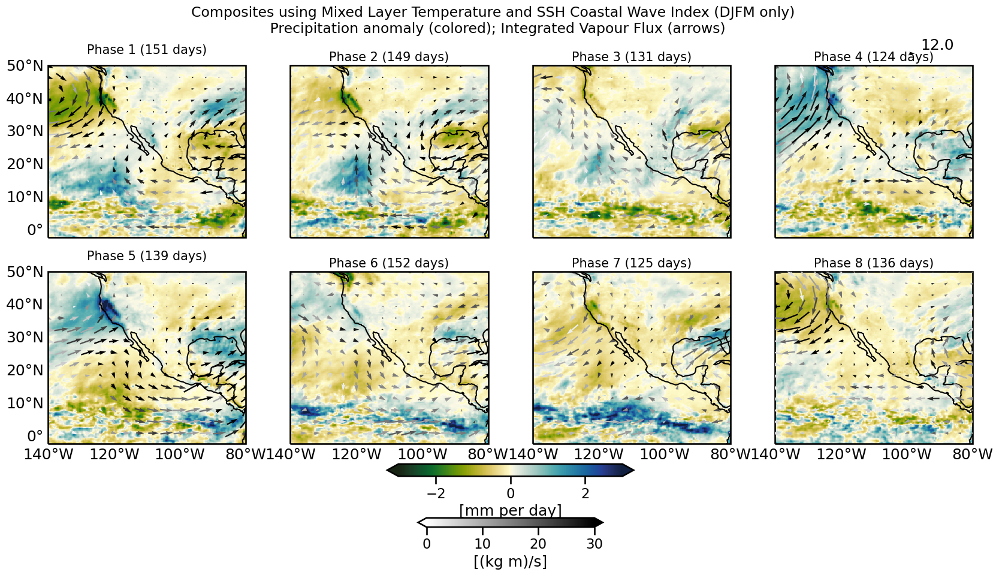

In [12]:
fig, axes = plt.subplots(ncols = 4, nrows = 2, figsize = (20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
z500_levels = np.arange(-0.4, 0.41, 0.1) 
# fig.tight_layout()

fig.suptitle("Composites using Mixed Layer Temperature and SSH Coastal Wave Index (DJFM only) \n Precipitation anomaly (colored); Integrated Vapour Flux (arrows)", fontsize = 17)

for phase, phase_indices in phases_dict.items():
    phase_num = int(phase) - 1; i = phase_num
    ax = axes.flatten(order = "C")[phase_num]

    if phase != "8":
        IVT = prepare_IVTE_and_IVTN(DJF_phases, phase)
        DJF_phases["Precip"][phase].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3, vmax = 3, add_colorbar = False)
        IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
                    add_guide = False, cmap = "gist_yarg", width = 0.007, vmin = 0, vmax = 30)

        ax.set_title("Phase " + str(phase_num+1) + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 15)

        # ax.clabel(cs, inline=True, fontsize=10)
    else:
        IVT = prepare_IVTE_and_IVTN(DJF_phases, phase)
        IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
            add_guide = True, cmap = "gist_yarg", width = 0.007, vmin = 0, vmax = 30, zorder=10,
                    cbar_kwargs = {"label":"[(kg m)/s]", "extend": "both",  "orientation":"horizontal", "ax":axes, "fraction":0.02, "pad":0.09})
        DJF_phases["Precip"][phase].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3, vmax = 3, add_colorbar = True,zorder=0, 
                                                                                               cbar_kwargs = {"label":"[mm per day]", "extend": "both", 
                                                                                                              "orientation":"horizontal", "ax":axes,
                                                                                                             "fraction":0.03, "pad":0.05})

        
        ax.set_title("Phase " + str(phase_num+1) + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 15)

for (i, ax) in enumerate(axes[:, 0].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.bottom_labels = False
    gl.right_labels = False
    
    
for (i, ax) in enumerate(axes[1, :].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = False
[ax.coastlines() for ax in axes.flatten()];

    
fig.savefig(plotsdir(INDEX_TYPE + "_Index_Precip_IVT_CompositesDJF.png"), bbox_inches = "tight")

In [242]:
fig, axes = plt.subplots(ncols = 4, nrows = 2, figsize = (20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
z500_levels = np.arange(-0.4, 0.41, 0.1) 
# fig.tight_layout()
[ax.coastlines() for ax in axes.flatten()];

fig.suptitle("Composites using Mixed Layer Temperature and SSH Coastal Wave Index (DJFM only) \n Total Column Water Vapour Anomaly (colored); Integrated Vapour Flux Anomaly (arrows)", fontsize = 17)

for phase, phase_indices in phases_dict.items():
    phase_num = int(phase) - 1; i = phase_num
    ax = axes.flatten(order = "C")[phase_num]
    IVT = prepare_IVTE_and_IVTN(DJF_phases, phase)

    if phase != "8":
        DJF_phases["TCWV"][phase].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3, vmax = 3, add_colorbar = False)
        IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
                    add_guide = False, cmap = "gist_yarg", width = 0.007, vmin = 0, vmax = 30)

        ax.set_title("Phase " + str(phase_num+1) + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 15)

        # ax.clabel(cs, inline=True, fontsize=10)
    else:
        IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
            add_guide = True, cmap = "gist_yarg", width = 0.007, vmin = 0, vmax = 30, zorder=10,
                    cbar_kwargs = {"label":"[$kg ~ m ~ s^{-1}$]", "extend": "both",  "orientation":"horizontal", "ax":axes, "fraction":0.02, "pad":0.09})
        DJF_phases["TCWV"][phase].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3, vmax = 3, add_colorbar = True, zorder=0,
                                                                                               cbar_kwargs = {"label":r"[$kg ~ m^{-2}$]", "extend": "both", 
                                                                                                              "orientation":"horizontal", "ax":axes,
                                                                                                             "fraction":0.03, "pad":0.05})

        
        ax.set_title("Phase " + str(phase_num+1) + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 15)
        # ax.clabel(cs, inline=True, fontsize=10)

for (i, ax) in enumerate(axes[:, 0].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.bottom_labels = False
    gl.right_labels = False
    
    
for (i, ax) in enumerate(axes[1, :].flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = False

    
fig.savefig(plotsdir(INDEX_TYPE + "_Index_TCWV_IVT_CompositesDJF.png"), bbox_inches = "tight")

AttributeError: Rectangle.set() got an unexpected keyword argument 'cmap'

## Overlaying the z500 height anomaly contours on SST 

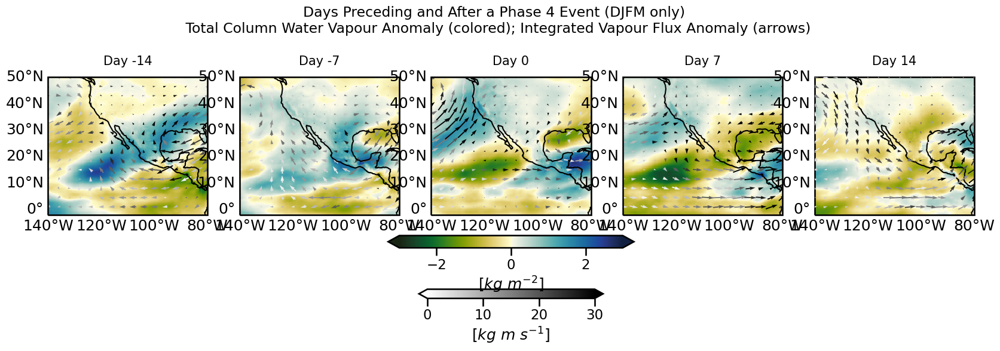

In [14]:
fig, axes = plt.subplots(ncols = 5, nrows = 1, figsize = (20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
z500_levels = np.arange(-0.4, 0.41, 0.1) 
# fig.tight_layout()

fig.suptitle("Days Preceding and After a Phase 4 Event (DJFM only) \n Total Column Water Vapour Anomaly (colored); Integrated Vapour Flux Anomaly (arrows)", y = 0.6, fontsize = 17)

phase_indices = phases_dict[phase]
num_phases_days = len(phase_indices)
for day_num, day in enumerate([-14, -7, 0, 7, 14]):
    ax = axes.flatten(order = "C")[day_num]
    IVT = prepare_IVTE_and_IVTN(DJF_phase4_dict).sel(day = day)
    if day != 14:
        DJF_phase4_dict["TCWV"].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80), day = day).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3.0, vmax = 3.0, add_colorbar = False)

        IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
                    add_guide = False, cmap = "gist_yarg", width = 0.007, vmin = 0, vmax = 30)
        ax.set_title("Day " + str(day), fontsize = 15)
    else:
        IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
            add_guide = True, cmap = "gist_yarg", width = 0.007, vmin = 0, vmax = 30, zorder=10,
                    cbar_kwargs = {"label":"[$kg ~ m ~ s^{-1}$]", "extend": "both",  "orientation":"horizontal", "ax":axes, "fraction":0.02, "pad":0.09})
        DJF_phase4_dict["TCWV"].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80), day = day).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3.0, vmax = 3.0, add_colorbar = True,
                                                                                               cbar_kwargs = {"label":"[$kg ~ m^{-2}$]", "extend": "both", 
                                                                                                              "orientation":"horizontal", "ax":axes,
                                                                                                             "fraction":0.03, "pad":0.05})

        ax.set_title("Day " + str(day), fontsize = 15)


for (i, ax) in enumerate(axes.flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.bottom_labels = False
    gl.right_labels = False
    
    
for (i, ax) in enumerate(axes.flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = False

    
[ax.coastlines() for ax in axes.flatten()];
fig.savefig(plotsdir(INDEX_TYPE + "_Index_Phase4_TCWV_IVT_CompositesDJF.png"), bbox_inches = "tight")

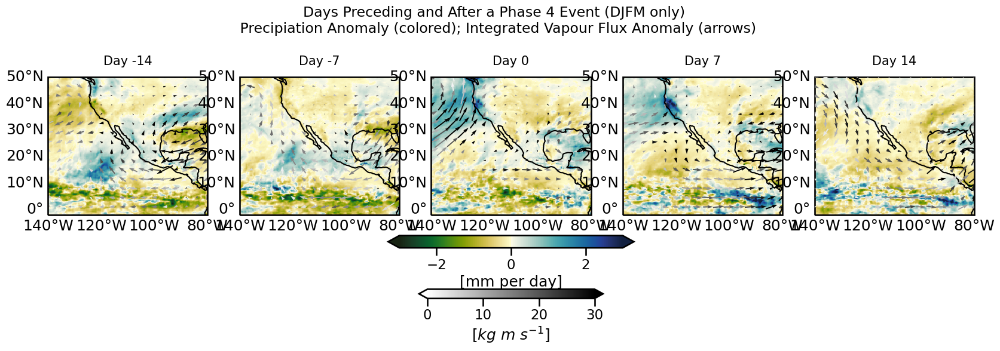

In [15]:
fig, axes = plt.subplots(ncols = 5, nrows = 1, figsize = (20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
z500_levels = np.arange(-0.4, 0.41, 0.1) 
# fig.tight_layout()

fig.suptitle("Days Preceding and After a Phase 4 Event (DJFM only) \n Precipiation Anomaly (colored); Integrated Vapour Flux Anomaly (arrows)", y = 0.6, fontsize = 17)

phase_indices = phases_dict[phase]
num_phases_days = len(phase_indices)
for day_num, day in enumerate([-14, -7, 0, 7, 14]):
    ax = axes.flatten(order = "C")[day_num]
    IVT = prepare_IVTE_and_IVTN(DJF_phase4_dict).sel(day = day)
    if day != 14:
        DJF_phase4_dict["Precip"].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80), day = day).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3.0, vmax = 3.0, add_colorbar = False)

        IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
                    add_guide = False, cmap = "gist_yarg", width = 0.007, vmin = 0, vmax = 30)
        ax.set_title("Day " + str(day), fontsize = 15)
    else:
        IVT.plot.quiver(ax = ax, x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
        add_guide = True, cmap = "gist_yarg", width = 0.007, vmin = 0, vmax = 30, zorder=10,
                    cbar_kwargs = {"label":"[$kg ~ m ~ s^{-1}$]", "extend": "both",  "orientation":"horizontal", "ax":axes, "fraction":0.02, "pad":0.09})
        DJF_phase4_dict["Precip"].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80), day = day).plot(ax = ax, cmap = cm.delta_r,transform = ccrs.PlateCarree(),
                                                                                              vmin = -3.0, vmax = 3.0, add_colorbar = True,
                                                                                               cbar_kwargs = {"label":"[mm per day]", "extend": "both", 
                                                                                                              "orientation":"horizontal", "ax":axes,
                                                                                                             "fraction":0.03, "pad":0.05})

        ax.set_title("Day " + str(day), fontsize = 15)


for (i, ax) in enumerate(axes.flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.bottom_labels = False
    gl.right_labels = False
    
    
for (i, ax) in enumerate(axes.flatten()):
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='gray', alpha=0.0, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = False

    
[ax.coastlines() for ax in axes.flatten()];
fig.savefig(plotsdir(INDEX_TYPE + "_Index_Phase4_PRCP_IVT_CompositesDJF.png"), bbox_inches = "tight")

In [16]:
# fig, axes = plt.subplots(ncols = 5, nrows = 8, figsize = (15, 40), subplot_kw={'projection': ccrs.PlateCarree()})
# fig.suptitle("Composites using Mixed Layer Temperature and SSH Coastal Wave Index (DJFM only)", y = 0.8, fontsize = 15)
# for phase, phase_indices in phases_dict.items():
#     print(phase)
#     phase_num = int(phase) - 1 
#     IVT = prepare_IVTE_and_IVTN(DJF_phases, phase)
#     if phase != "8":
#         DJF_phases["SST"][phase].sel(latitude = slice(-2, 50), longitude = slice(-140, -80)).plot(ax = axes[phase_num, 0], cmap = cm.balance,transform=ccrs.PlateCarree(),
#                                                                                               vmin = -0.5, vmax = 0.5, add_colorbar = False)
#         DJF_phases["Precip"][phase].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = axes[phase_num, 1], cmap = cm.balance,transform=ccrs.PlateCarree(),
#                                                                                               vmin = -2.0, vmax = 2.0, add_colorbar = False)
#         DJF_phases["TCWV"][phase].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = axes[phase_num, 2], cmap = cm.balance,transform=ccrs.PlateCarree(),
#                                                                                               vmin = -2.5, vmax = 2.5, add_colorbar = False)
#         DJF_phases["z500"][phase].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = axes[phase_num, 3], cmap = cm.balance,transform=ccrs.PlateCarree(),
#                                                                                               vmin = -0.4, vmax = 0.4, add_colorbar = False)
#         IVT.plot.quiver(ax = axes[phase_num, 4], x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
#                     add_guide = False, cmap = "Greens", vmin = -0, vmax = 50, width = 0.009)
#         fig.tight_layout()
#     else:
#         DJF_phases["SST"][phase].sel(latitude = slice(-2, 50), longitude = slice(-140, -80)).plot(ax = axes[phase_num, 0], cmap = cm.balance,
#                                                                                               vmin = -0.5, vmax = 0.5, add_colorbar = True,transform=ccrs.PlateCarree(),
#                                                                                                cbar_kwargs = {"label":"[°C]", "extend": "both", 
#                                                                                                               "orientation":"horizontal", "ax":axes[:, 0],
#                                                                                                              "fraction":0.04, "pad":0.01})
#         DJF_phases["Precip"][phase].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = axes[phase_num, 1], cmap = cm.balance,
#                                                                                               vmin = -2.0, vmax = 2.0, add_colorbar = True,transform=ccrs.PlateCarree(),
#                                                                                                cbar_kwargs = {"label":"[mm/day]", "extend": "both", 
#                                                                                                               "orientation":"horizontal", "ax":axes[:, 1],
#                                                                                                              "fraction":0.04, "pad":0.01})
#         DJF_phases["TCWV"][phase].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = axes[phase_num, 2], cmap = cm.balance,
#                                                                                               vmin = -2.5, vmax = 2.5, add_colorbar = True,transform=ccrs.PlateCarree(),
#                                                                                                cbar_kwargs = {"label":"[kg/m^3]", "extend": "both", 
#                                                                                                               "orientation":"horizontal", "ax":axes[:, 2],
#                                                                                                               "fraction":0.04, "pad":0.01})
#         DJF_phases["z500"][phase].sel(latitude = slice(50,  -2)).sel(longitude = slice(-140, -80)).plot(ax = axes[phase_num, 3], cmap = cm.balance,
#                                                                                               vmin = -0.4, vmax = 0.4, add_colorbar = True,transform=ccrs.PlateCarree(),
#                                                                                                cbar_kwargs = {"label":"[km]", "extend": "both", 
#                                                                                                               "orientation":"horizontal", "ax":axes[:, 3],
#                                                                                                               "fraction":0.04, "pad":0.01})  
#         IVT.plot.quiver(ax = axes[phase_num, 4], x = "longitude", y = "latitude",u = "IVTE", v = "IVTN", hue = "IVT", transform=ccrs.PlateCarree(),
#                     add_guide = True, cmap = "Greens", vmin = 0, vmax = 50, width = 0.009, 
#                     cbar_kwargs = {"label":"[(kg m)/s]", "extend": "both",  "orientation":"horizontal", "ax":axes[:, 4], "fraction":0.04, "pad":0.01})

# [ax.set_title("") for ax in axes.flatten()];
# [ax.set_title("SST Anomaly") for ax in axes[:, 0].flatten()]
# [ax.set_title("Total Precipiation \n Anomaly") for ax in axes[:, 1].flatten()]
# [ax.set_title("Total Column Water \n Vapor Anomaly") for ax in axes[:, 2].flatten()]
# [ax.set_title("z500 Height Anomaly") for ax in axes[:, 3].flatten()]
# [ax.set_title("Vertical Integral of \n Water Vapour Flux") for ax in axes[:, 4].flatten()]


# for (i, ax) in enumerate(axes[:, 0].flatten()):
#     gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
#                       linewidth=1, color='gray', alpha=0.0, linestyle='--')
#     gl.top_labels = False
#     gl.bottom_labels = False
#     gl.right_labels = False
    
#     ax.text(-0.3, 0.55, "Phase " + str(i+1) + " (" + str(len(phases_dict[str(i+1)])) + " days)", fontsize = 15, va='bottom', ha='center',
#         rotation='vertical', rotation_mode='anchor',
#         transform=ax.transAxes)
    
# [ax.coastlines() for ax in axes.flatten()];
